<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Task" data-toc-modified-id="Task-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Task</a></span><ul class="toc-item"><li><span><a href="#Binary-encoding-and-metrics" data-toc-modified-id="Binary-encoding-and-metrics-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Binary encoding and metrics</a></span></li></ul></li><li><span><a href="#Naive-baseline" data-toc-modified-id="Naive-baseline-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Naive baseline</a></span><ul class="toc-item"><li><span><a href="#Metrics" data-toc-modified-id="Metrics-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Metrics</a></span></li></ul></li><li><span><a href="#Model-that-can-read" data-toc-modified-id="Model-that-can-read-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Model that can read</a></span></li><li><span><a href="#GridSearch-for-model-parameters" data-toc-modified-id="GridSearch-for-model-parameters-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>GridSearch for model parameters</a></span><ul class="toc-item"><li><span><a href="#Manual-search" data-toc-modified-id="Manual-search-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Manual search</a></span></li><li><span><a href="#Automated-search" data-toc-modified-id="Automated-search-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Automated search</a></span></li></ul></li><li><span><a href="#Decision-trees" data-toc-modified-id="Decision-trees-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Decision trees</a></span></li></ul></div>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_palette('muted')
sns.set_color_codes('muted')
sns.set_style('white')

In [2]:
%config InlineBackend.figure_format = 'retina'

Seminar plan:

1. Grid Search & friends
1. Decision trees

# Task

https://youtrack.jetbrains.com/issues/IDEA

Predict the issue type at the moment when the new issue is reported

Process model:

1. External users create a new issue. They specify its summary and description. Author ID and creation date are recorded automatically. For simplicity, we think that summary and description cannot be changed since then.
1. At some point in time issue becomes resolved. We're interested in the value of the Priority field at this moment. Again, for simplicity we suppose that the value of the Priority field did not change since then.

Therefore everything we need is `id`, `reporter`, `created`, `summary` and `description` of all resolved IDEA issues that were created by an external user.

In [3]:
df = pd.read_json('../data/issues.json.zip', lines=True)

In [4]:
df.sample(5)

,summary,idReadable,commentsCount,reporter,comments,customFields,created,description,id,$type
71936,Restore Layout - duplicates Tool Window consol...,IDEA-160179,1,"{'login': 'meo', '$type': 'User'}","[{'author': {'login': 'irina', 'name': 'Irina ...","[{'value': {'name': 'Normal', '$type': 'EnumBu...",1471957906582,!image.png!\n\n\nIntelliJ IDEA 2016.2.3 EAP ...,25-1287600,Issue
34704,White background for JPA ER Diagram in Darcula...,IDEA-96337,0,"{'login': 'Antonel.Ernest.Pazargic', '$type': ...",[],"[{'value': {'name': 'Normal', '$type': 'EnumBu...",1354366726415,See the attachment.,25-492080,Issue
81744,(Some) Inspections run on library sources,IDEA-176824,4,"{'login': 'sabio', '$type': 'User'}","[{'author': {'login': 'anet', 'name': 'Anna Ko...","[{'value': {'name': 'Normal', '$type': 'EnumBu...",1501249203448,"I noticed ""Incompatible types"" error highlight...",25-1641297,Issue
16118,Internal error during start of IntelliJ after ...,IDEA-66911,5,"{'login': 'rfalke', '$type': 'User'}","[{'author': {'login': 'Andrey.S', 'name': 'And...","[{'value': {'name': 'Normal', '$type': 'EnumBu...",1300807917570,Step 1: IDE was killed via the OS\nStep 2: IDE...,25-274248,Issue
51766,Generate doesn't work in editor's context menu...,IDEA-126315,4,"{'login': 'Андрей_Рахимов', '$type': 'User'}","[{'author': {'login': 'anet', 'name': 'Anna Ko...","[{'value': {'name': 'Normal', '$type': 'EnumBu...",1403066829796,Unexpectedly generate stop working where was p...,25-708376,Issue


In [5]:
!pip install sklearn_pandas

In [6]:
from sklearn_pandas import DataFrameMapper
from sklearn.preprocessing import FunctionTransformer

In [7]:
# the code in this cell is less readable, more usable analog of:
# df['type'] = df.customFields.map(lambda x: [cf['value']['name'] for cf in x if cf['name'] == 'Type'][0])
# df['reporter'] = df.reporter.map(lambda x: x['login'])
# df['created'] = pd.to_datetime(df.created, unit='ms')

formatter = DataFrameMapper([
    ('customFields', FunctionTransformer(
        lambda c: c.map(lambda x: [cf['value']['name'] for cf in x if cf['name'] == 'Type'][0])
    ), {'alias': 'type'}),
    ('reporter', FunctionTransformer(lambda c: c.map(lambda x: x['login']))),
    ('created', FunctionTransformer(lambda c: pd.to_datetime(c, unit='ms'))),
    ('summary', None),
    ('description', None),
    (['summary', 'description'], 
     FunctionTransformer(lambda x: x.summary.fillna('') + '\n\n' + x.description.fillna('')),
     dict(alias='text')
    ),
    ('idReadable', None)
], input_df=True, df_out=True)
formatter.fit_transform(df).sample(5)

,type,reporter,created,summary,description,text,idReadable
102342,Bug,okonet,2019-07-18 11:46:13.175,Modal windows won't close in Full Screen mode ...,What steps will reproduce the problem?\n1. Ope...,Modal windows won't close in Full Screen mode ...,IDEA-218816
78220,Feature,oleg.estekhin,2017-04-05 13:59:36.611,"""IDE Fatal Errors"" report should use account i...","I have IDEA installed by Toolbox, so i have al...","""IDE Fatal Errors"" report should use account i...",IDEA-171032
63838,Bug,alexhart,2015-10-15 13:02:23.573,Android Plugin incorrectly reports warning for...,If I create a fragment transaction and do not ...,Android Plugin incorrectly reports warning for...,IDEA-146431
84240,Feature,survivant,2017-11-01 13:19:15.345,Be able to save the diagnostic from the IDE Fa...,I found some errors in IntelliJ and I create i...,Be able to save the diagnostic from the IDE Fa...,IDEA-181518
72260,Bug,Antoine.Levy-Lambert,2016-09-01 14:53:12.031,deadlock in IntelliJ 2016.2,This happens on version 2016.2 on Debian Linux...,deadlock in IntelliJ 2016.2\n\nThis happens on...,IDEA-160670


In [8]:
X = formatter.transform(df)[['idReadable', 'summary', 'description', 'text', 'reporter', 'created']]
X.sample(5)

,idReadable,summary,description,text,reporter,created
97901,IDEA-207539,Editor ignores Code Style configuration and us...,What steps will reproduce the issue?\n1. Confi...,Editor ignores Code Style configuration and us...,foobar_1997,2019-02-19 10:16:12.723
71287,IDEA-158943,Syntax highlighting not working,Periodically stops working syntax highlighting...,Syntax highlighting not working\n\nPeriodicall...,pe4enko,2016-07-22 17:34:22.878
71251,IDEA-158931,Search and replace dialog moves after every ac...,What steps will reproduce the problem?\n1. Sea...,Search and replace dialog moves after every ac...,Mathijs_Futselaar,2016-07-22 07:39:21.644
101637,IDEA-217340,Local history should use date and time formats...,"I submitted this to Diff and Merge, but it is ...",Local history should use date and time formats...,daveyost,2019-07-01 19:53:51.507
50815,IDEA-124806,IDEA should report instances where a static me...,"Clumsily worded summary, an example might be e...",IDEA should report instances where a static me...,Simen.Bekkhus,2014-05-06 10:02:57.346


In [9]:
y = formatter.transform(df)['type']

In [10]:
y.value_counts(normalize=True)

Bug                                                   0.688420
Feature                                               0.141135
Usability Problem                                     0.098143
Cosmetics                                             0.026260
Performance Problem                                   0.020524
Exception                                             0.013931
Task                                                  0.007261
Support Request                                       0.001829
Configuration Problem                                 0.001115
Meta Issue                                            0.000848
Auto-reported Exception                               0.000324
Security Problem                                      0.000200
Security (deprecated use Security Problem instead)    0.000010
Name: type, dtype: float64

## Binary encoding and metrics

There are two ways to encode the target to binary: `y_binary = y == 'Bug'` and `y_binary = y != 'Bug'`. Which one to choose?

It depends on which errors are more critical to us and which metrics do we use. 

Example: it is more important to decrease the load on support engineers (who handle bugs) $\implies$ we need to detect as many non-bugs as possible $\implies$ we have to choose `y_binary = y != 'Bug'` and look closely at the recall rate (percent of all non-bugs that were discovered).

In [11]:
binary_transformer = FunctionTransformer(lambda c: c != 'Bug')
y_binary = binary_transformer.fit_transform(y)

In [12]:
y_binary.value_counts(normalize=True)

False    0.68842
True     0.31158
Name: type, dtype: float64

# Naive baseline

In [13]:
from sklearn.dummy import DummyClassifier

In [14]:
dummy = DummyClassifier(strategy='most_frequent')

In [15]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_bin_train, y_bin_test = train_test_split(X, y_binary)

In [16]:
dummy.fit(X_train, y_bin_train)

DummyClassifier(strategy='most_frequent')

In [17]:
dummy.predict(X_train)# .any()

array([False, False, False, ..., False, False, False])

## Metrics

In [18]:
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score

In [19]:
accuracy_score(y_true=y_bin_train, y_pred=dummy.predict(X_train))

0.6895224301558868

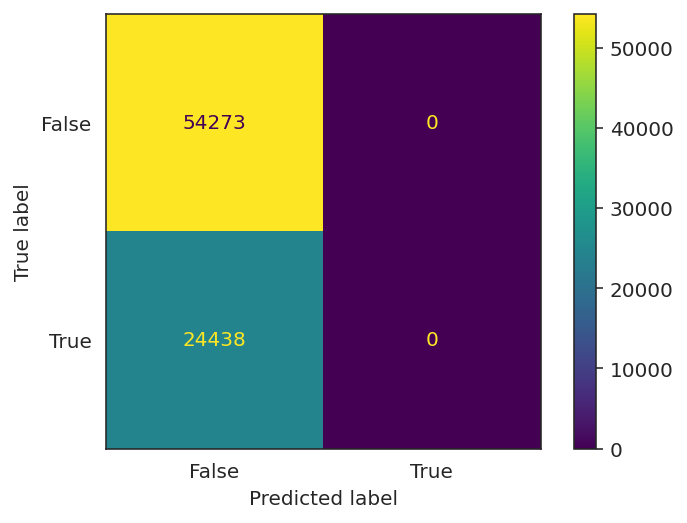

In [20]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(estimator=dummy, X=X_train, y_true=y_bin_train)

In [21]:
precision_score(y_true=y_bin_train, y_pred=dummy.predict(X_train))

/opt/conda/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0

In [22]:
recall_score(y_true=y_bin_train, y_pred=dummy.predict(X_train))

0.0

# Model that can read

In [23]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

In [24]:
preprocessor = DataFrameMapper([
    ('text', TfidfVectorizer(
            min_df=.05, 
        max_df=.5, token_pattern=r'[A-Za-z]{2,}', stop_words='english'
    ))
], input_df=True, df_out=True).fit(X_train)
preprocessor.transform(X_train.sample(5))

,text_access,text_add,text_amd,text_application,text_attached,text_bit,text_build,text_built,text_button,text_case,...,text_vm,text_void,text_want,text_way,text_window,text_windows,text_work,text_working,text_works,text_xml
27234,0.0,0.0,0.0,0.0,0.247767,0.0,0.0,0.0,0.0,0.0,...,0.266288,0.0,0.0,0.0,0.000000,0.0,0.0,0.279717,0.0,0.000000
41921,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000
47052,0.0,0.0,0.0,0.0,0.080652,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.536634
61961,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.169898,0.0,0.0,0.000000,0.0,0.000000
65817,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000


In [25]:
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LogisticRegression

In [26]:
lr = make_pipeline(preprocessor.set_params(df_out=False), LogisticRegression())
lr.fit(X_train, y_bin_train)

Pipeline(steps=[('dataframemapper',
                 DataFrameMapper(drop_cols=[],
                                 features=[('text',
                                            TfidfVectorizer(max_df=0.5,
                                                            min_df=0.05,
                                                            stop_words='english',
                                                            token_pattern='[A-Za-z]{2,}'))],
                                 input_df=True)),
                ('logisticregression', LogisticRegression())])

In [27]:
lr.predict(X_train).all()

False

In [28]:
accuracy_score(y_true=y_bin_train, y_pred=lr.predict(X_train))

0.7401125636823316

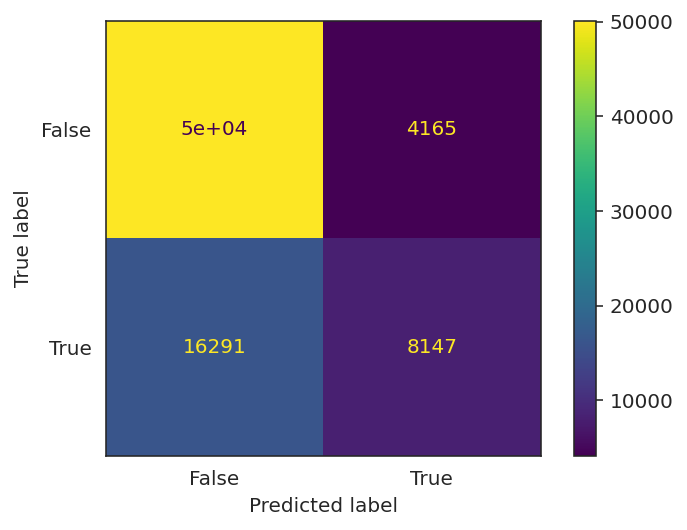

In [29]:
plot_confusion_matrix(estimator=lr, X=X_train, y_true=y_bin_train)

In [30]:
precision_score(y_true=y_bin_train, y_pred=lr.predict(X_train))

0.6617121507472384

In [31]:
recall_score(y_true=y_bin_train, y_pred=lr.predict(X_train))

0.3333742532122105

In [32]:
f1_score(y_true=y_bin_train, y_pred=lr.predict(X_train))

0.44337414965986394

In [33]:
from sklearn.metrics import precision_recall_curve
precision, recall, thresholds = precision_recall_curve(y_bin_test, lr.predict_proba(X_test)[:,1])

In [34]:
recall_score(y_bin_test, lr.predict(X_test))

0.3350278382958122

In [35]:
import plotly.express as px

In [36]:
px.line(y=precision[:-1], x=recall[:-1], text=thresholds, labels=dict(x='recall', y='precision'))

# GridSearch for model parameters

In [37]:
lr = make_pipeline(
    TfidfVectorizer(
            min_df=.05, max_df=.5, token_pattern=r'[A-Za-z]{2,}', stop_words='english'
    ),
    LogisticRegression()
)
lr.fit(X_train['text'], y_bin_train)

Pipeline(steps=[('tfidfvectorizer',
                 TfidfVectorizer(max_df=0.5, min_df=0.05, stop_words='english',
                                 token_pattern='[A-Za-z]{2,}')),
                ('logisticregression', LogisticRegression())])

In [38]:
from sklearn.model_selection import ParameterGrid

In [39]:
param_grid = dict(min_df=[.05, .1], max_df=[.2, .3, .5])
param_grid

{'min_df': [0.05, 0.1], 'max_df': [0.2, 0.3, 0.5]}

## Manual search

**Task**: code the grid search =)

In [40]:
# due time: 13:20
from tqdm import tqdm
results = []
for params in tqdm(ParameterGrid(param_grid)):
#     print(params)
    lr = make_pipeline(
        TfidfVectorizer(
            min_df=params['min_df'], max_df=params['max_df'], 
            token_pattern=r'[A-Za-z]{2,}', stop_words='english'
        ),
        LogisticRegression()
    )
    lr.fit(X_train['text'], y_bin_train)
    results.append(dict(
        estimator=lr,
        parameters=params,
        train_precision=precision_score(y_true=y_bin_train, y_pred=lr.predict(X_train['text'])),
        test_precision=precision_score(y_true=y_bin_test, y_pred=lr.predict(X_test['text'])),
        train_recall=recall_score(y_true=y_bin_train, y_pred=lr.predict(X_train['text'])),
        test_recall=recall_score(y_true=y_bin_test, y_pred=lr.predict(X_test['text'])),
    ))

100%|██████████| 6/6 [03:48<00:00, 38.07s/it]


In [41]:
results = pd.DataFrame(results)
# results
results.drop(columns='estimator').sort_values('test_recall').style.bar(vmin=0, vmax=1)

,parameters,train_precision,test_precision,train_recall,test_recall
3,"{'max_df': 0.3, 'min_df': 0.1}",0.639544,0.653527,0.192978,0.190632
1,"{'max_df': 0.2, 'min_df': 0.1}",0.628319,0.641908,0.203372,0.198741
5,"{'max_df': 0.5, 'min_df': 0.1}",0.638874,0.658909,0.198789,0.198741
0,"{'max_df': 0.2, 'min_df': 0.05}",0.658195,0.672435,0.325354,0.329218
2,"{'max_df': 0.3, 'min_df': 0.05}",0.661875,0.674498,0.329691,0.333575
4,"{'max_df': 0.5, 'min_df': 0.05}",0.661712,0.674628,0.333374,0.335028


Short reminder: precision and recall are threshold-dependent, it is better to use sth elsee for cross-validation.

In [42]:
best_estimator = results.loc[results.test_recall.idxmax()].estimator

In [43]:
from sklearn.metrics import precision_recall_curve
precision, recall, thresholds = precision_recall_curve(y_bin_test, best_estimator.predict_proba(X_test['text'])[:,1])

In [44]:
recall_score(y_bin_test, best_estimator.predict(X_test['text']))

0.3350278382958122

In [45]:
import plotly.express as px

In [46]:
px.line(y=precision[:-1], x=recall[:-1], text=thresholds, labels=dict(x='recall', y='precision'))

## Automated search

In [47]:
from sklearn.model_selection import GridSearchCV

In [48]:
pipe = make_pipeline(
        TfidfVectorizer(token_pattern=r'[A-Za-z]{2,}', stop_words='english'),
        LogisticRegression()
    )
cv = GridSearchCV(
    estimator=pipe,
    param_grid=dict(tfidfvectorizer__min_df=[.05, .02], tfidfvectorizer__max_df=[.1, .3, .6]),
    scoring=['precision', 'recall'],
    cv=5,
    refit=False,
    verbose=5
)

In [49]:
cv.fit(X_train['text'], y_bin_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV 1/5] END tfidfvectorizer__max_df=0.1, tfidfvectorizer__min_df=0.05; precision: (test=0.605) recall: (test=0.213) total time=  10.6s
[CV 2/5] END tfidfvectorizer__max_df=0.1, tfidfvectorizer__min_df=0.05; precision: (test=0.607) recall: (test=0.197) total time=  10.6s
[CV 3/5] END tfidfvectorizer__max_df=0.1, tfidfvectorizer__min_df=0.05; precision: (test=0.594) recall: (test=0.200) total time=  10.6s
[CV 4/5] END tfidfvectorizer__max_df=0.1, tfidfvectorizer__min_df=0.05; precision: (test=0.619) recall: (test=0.209) total time=  10.7s
[CV 5/5] END tfidfvectorizer__max_df=0.1, tfidfvectorizer__min_df=0.05; precision: (test=0.611) recall: (test=0.213) total time=  10.5s


/opt/conda/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV 1/5] END tfidfvectorizer__max_df=0.1, tfidfvectorizer__min_df=0.02; precision: (test=0.714) recall: (test=0.401) total time=  11.2s


/opt/conda/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV 2/5] END tfidfvectorizer__max_df=0.1, tfidfvectorizer__min_df=0.02; precision: (test=0.714) recall: (test=0.391) total time=  11.2s


/opt/conda/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV 3/5] END tfidfvectorizer__max_df=0.1, tfidfvectorizer__min_df=0.02; precision: (test=0.718) recall: (test=0.414) total time=  11.1s


/opt/conda/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV 4/5] END tfidfvectorizer__max_df=0.1, tfidfvectorizer__min_df=0.02; precision: (test=0.715) recall: (test=0.415) total time=  11.4s


/opt/conda/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV 5/5] END tfidfvectorizer__max_df=0.1, tfidfvectorizer__min_df=0.02; precision: (test=0.732) recall: (test=0.408) total time=  11.2s
[CV 1/5] END tfidfvectorizer__max_df=0.3, tfidfvectorizer__min_df=0.05; precision: (test=0.654) recall: (test=0.326) total time=  10.9s
[CV 2/5] END tfidfvectorizer__max_df=0.3, tfidfvectorizer__min_df=0.05; precision: (test=0.673) recall: (test=0.331) total time=  11.0s
[CV 3/5] END tfidfvectorizer__max_df=0.3, tfidfvectorizer__min_df=0.05; precision: (test=0.649) recall: (test=0.325) total time=  10.9s
[CV 4/5] END tfidfvectorizer__max_df=0.3, tfidfvectorizer__min_df=0.05; precision: (test=0.655) recall: (test=0.330) total time=  10.9s
[CV 5/5] END tfidfvectorizer__max_df=0.3, tfidfvectorizer__min_df=0.05; precision: (test=0.666) recall: (test=0.330) total time=  11.5s


/opt/conda/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV 1/5] END tfidfvectorizer__max_df=0.3, tfidfvectorizer__min_df=0.02; precision: (test=0.736) recall: (test=0.451) total time=  11.6s


/opt/conda/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV 2/5] END tfidfvectorizer__max_df=0.3, tfidfvectorizer__min_df=0.02; precision: (test=0.732) recall: (test=0.448) total time=  11.3s


/opt/conda/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV 3/5] END tfidfvectorizer__max_df=0.3, tfidfvectorizer__min_df=0.02; precision: (test=0.738) recall: (test=0.459) total time=  11.4s


/opt/conda/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV 4/5] END tfidfvectorizer__max_df=0.3, tfidfvectorizer__min_df=0.02; precision: (test=0.728) recall: (test=0.461) total time=  11.2s


/opt/conda/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV 5/5] END tfidfvectorizer__max_df=0.3, tfidfvectorizer__min_df=0.02; precision: (test=0.743) recall: (test=0.448) total time=  11.3s
[CV 1/5] END tfidfvectorizer__max_df=0.6, tfidfvectorizer__min_df=0.05; precision: (test=0.659) recall: (test=0.329) total time=  10.9s
[CV 2/5] END tfidfvectorizer__max_df=0.6, tfidfvectorizer__min_df=0.05; precision: (test=0.675) recall: (test=0.333) total time=  10.7s
[CV 3/5] END tfidfvectorizer__max_df=0.6, tfidfvectorizer__min_df=0.05; precision: (test=0.650) recall: (test=0.328) total time=  10.8s
[CV 4/5] END tfidfvectorizer__max_df=0.6, tfidfvectorizer__min_df=0.05; precision: (test=0.653) recall: (test=0.332) total time=  10.8s
[CV 5/5] END tfidfvectorizer__max_df=0.6, tfidfvectorizer__min_df=0.05; precision: (test=0.669) recall: (test=0.330) total time=  10.8s


/opt/conda/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV 1/5] END tfidfvectorizer__max_df=0.6, tfidfvectorizer__min_df=0.02; precision: (test=0.737) recall: (test=0.452) total time=  11.4s


/opt/conda/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV 2/5] END tfidfvectorizer__max_df=0.6, tfidfvectorizer__min_df=0.02; precision: (test=0.735) recall: (test=0.448) total time=  11.2s


/opt/conda/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV 3/5] END tfidfvectorizer__max_df=0.6, tfidfvectorizer__min_df=0.02; precision: (test=0.738) recall: (test=0.458) total time=  11.4s


/opt/conda/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV 4/5] END tfidfvectorizer__max_df=0.6, tfidfvectorizer__min_df=0.02; precision: (test=0.728) recall: (test=0.461) total time=  11.3s


/opt/conda/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV 5/5] END tfidfvectorizer__max_df=0.6, tfidfvectorizer__min_df=0.02; precision: (test=0.744) recall: (test=0.449) total time=  11.3s


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('tfidfvectorizer',
                                        TfidfVectorizer(stop_words='english',
                                                        token_pattern='[A-Za-z]{2,}')),
                                       ('logisticregression',
                                        LogisticRegression())]),
             param_grid={'tfidfvectorizer__max_df': [0.1, 0.3, 0.6],
                         'tfidfvectorizer__min_df': [0.05, 0.02]},
             refit=False, scoring=['precision', 'recall'], verbose=5)

How to speed up:

- `GridSearchCV(n_jobs=-1)` would parallel the fitting process
- smaller sample would decrease the fit time
- smaller number of parameters (greedy strategy) would allow to fit less models

In [50]:
pd.DataFrame(cv.cv_results_)[['params', 'mean_test_precision', 'mean_test_recall']].style.bar(vmin=0, vmax=1)

,params,mean_test_precision,mean_test_recall
0,"{'tfidfvectorizer__max_df': 0.1, 'tfidfvectorizer__min_df': 0.05}",0.607188,0.206400
1,"{'tfidfvectorizer__max_df': 0.1, 'tfidfvectorizer__min_df': 0.02}",0.718537,0.405680
2,"{'tfidfvectorizer__max_df': 0.3, 'tfidfvectorizer__min_df': 0.05}",0.659364,0.328382
3,"{'tfidfvectorizer__max_df': 0.3, 'tfidfvectorizer__min_df': 0.02}",0.735404,0.453515
4,"{'tfidfvectorizer__max_df': 0.6, 'tfidfvectorizer__min_df': 0.05}",0.661068,0.330510
5,"{'tfidfvectorizer__max_df': 0.6, 'tfidfvectorizer__min_df': 0.02}",0.736410,0.453351


# Decision trees

In [51]:
from sklearn.tree import DecisionTreeClassifier
dt = make_pipeline(
        TfidfVectorizer(
            token_pattern=r'[A-Za-z]{2,}', stop_words='english', max_df=.3, min_df=.2
        ),
        DecisionTreeClassifier()
    )

In [52]:
dt.fit(X_train['text'], y_bin_train)

Pipeline(steps=[('tfidfvectorizer',
                 TfidfVectorizer(max_df=0.3, min_df=0.2, stop_words='english',
                                 token_pattern='[A-Za-z]{2,}')),
                ('decisiontreeclassifier', DecisionTreeClassifier())])

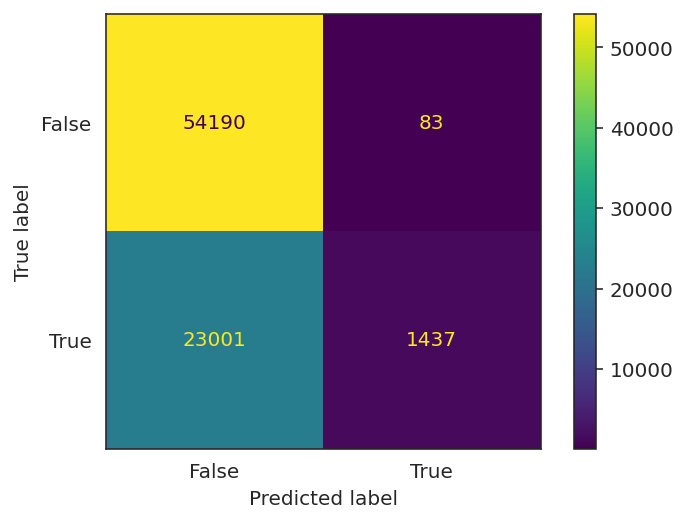

In [53]:
plot_confusion_matrix(estimator=dt, X=X_train['text'], y_true=y_bin_train)

In [54]:
precision_score(y_true=y_bin_train, y_pred=dt.predict(X_train['text']))

0.9453947368421053

In [55]:
recall_score(y_true=y_bin_train, y_pred=dt.predict(X_train['text']))

0.0588018659464768

In [56]:
precision_score(y_true=y_bin_test, y_pred=dt.predict(X_test['text']))

0.2471264367816092

In [57]:
recall_score(y_true=y_bin_test, y_pred=dt.predict(X_test['text']))

0.01561365286855483

The model above is simply overfitted. WHat should we do with it?

In [58]:
dt.named_steps['decisiontreeclassifier'].get_depth()

57

In [59]:
from sklearn.tree import plot_tree

[Text(161.04199448435637, 215.5655172413793, 'X[2] <= 0.0\ngini = 0.428\nsamples = 78711\nvalue = [54273, 24438]'),
 Text(44.69276797304552, 211.81655172413792, 'X[3] <= 0.066\ngini = 0.448\nsamples = 57865\nvalue = [38290, 19575]'),
 Text(17.65159726213392, 208.06758620689655, 'X[4] <= 0.068\ngini = 0.456\nsamples = 49543\nvalue = [32091, 17452]'),
 Text(5.246986084376192, 204.31862068965518, 'X[0] <= 0.547\ngini = 0.463\nsamples = 39552\nvalue = [25177, 14375]'),
 Text(4.326417718678484, 200.5696551724138, 'X[1] <= 0.999\ngini = 0.471\nsamples = 30628\nvalue = [19028, 11600]'),
 Text(3.459105374136842, 196.8206896551724, 'X[1] <= 0.998\ngini = 0.474\nsamples = 24892\nvalue = [15293, 9599]'),
 Text(2.5360010074317025, 193.07172413793103, 'X[0] <= 0.196\ngini = 0.474\nsamples = 24888\nvalue = [15292, 9596]'),
 Text(1.541888612518475, 189.32275862068965, 'X[0] <= 0.145\ngini = 0.474\nsamples = 24526\nvalue = [15076, 9450]'),
 Text(1.1361284513294025, 185.57379310344828, 'X[0] <= 0.105\n

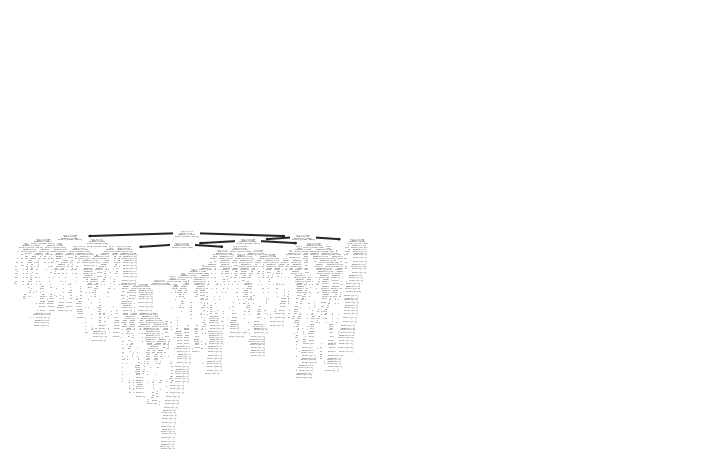

In [60]:
plot_tree(dt.named_steps['decisiontreeclassifier'])

In [61]:
dt = make_pipeline(
        TfidfVectorizer(token_pattern=r'[A-Za-z]{2,}', stop_words='english', max_df=.3, min_df=.2),
        DecisionTreeClassifier(max_depth=40, min_samples_leaf=10, min_samples_split=10)
    )
dt.fit(X_train['text'], y_bin_train)

Pipeline(steps=[('tfidfvectorizer',
                 TfidfVectorizer(max_df=0.3, min_df=0.2, stop_words='english',
                                 token_pattern='[A-Za-z]{2,}')),
                ('decisiontreeclassifier',
                 DecisionTreeClassifier(max_depth=40, min_samples_leaf=10,
                                        min_samples_split=10))])

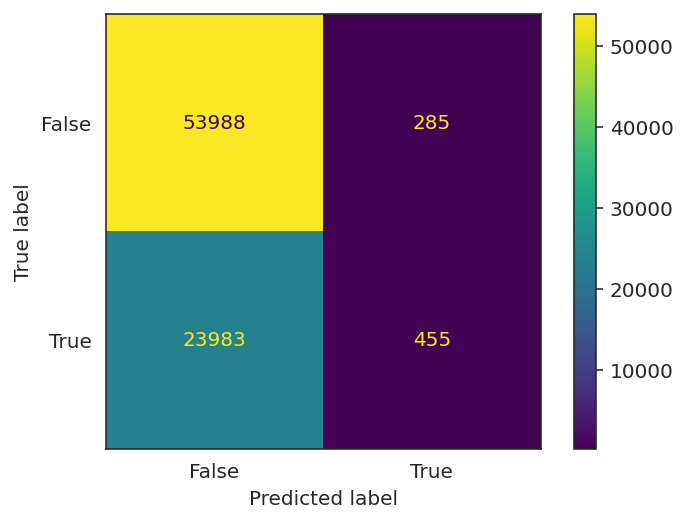

In [62]:
plot_confusion_matrix(estimator=dt, X=X_train['text'], y_true=y_bin_train)

In [63]:
precision_score(y_true=y_bin_train, y_pred=dt.predict(X_train['text']))

0.6148648648648649

In [64]:
recall_score(y_true=y_bin_train, y_pred=dt.predict(X_train['text']))

0.01861854488910713

**Task**: run grid search to find the best parameters for the Decision Tree model